In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# load file into dataframe
data = pd.read_csv('combined_financial_data.csv')

data.head()

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,ticker_attention,name_price_attention
0,0,2014-01-02,10107,MSFT,37.16,30423757.0,-0.006683,37.40,37.10,37.350,3.25,3.15
1,1,2014-01-03,10107,MSFT,36.91,30944370.0,-0.006728,37.22,36.60,37.200,3.38,1.54
2,2,2014-01-06,10107,MSFT,36.13,43111355.0,-0.021133,36.89,36.11,36.850,4.03,2.24
3,3,2014-01-07,10107,MSFT,36.41,35478667.0,0.007750,36.49,36.21,36.325,4.94,1.19
4,4,2014-01-08,10107,MSFT,35.76,59452427.0,-0.017852,36.14,35.58,36.000,5.33,1.68


In [4]:
# drop unnamed column
data = data.drop('Unnamed: 0', axis=1)

# check for missing values
data.isnull().sum()


date                    0
permno                  0
ticker                  0
price                   0
volume                  0
return                  0
high                    0
low                     0
open                    0
ticker_attention        0
name_price_attention    0
dtype: int64

In [5]:
data.head()

,date,permno,ticker,price,volume,return,high,low,open,ticker_attention,name_price_attention
0,2014-01-02,10107,MSFT,37.16,30423757.0,-0.006683,37.40,37.10,37.350,3.25,3.15
1,2014-01-03,10107,MSFT,36.91,30944370.0,-0.006728,37.22,36.60,37.200,3.38,1.54
2,2014-01-06,10107,MSFT,36.13,43111355.0,-0.021133,36.89,36.11,36.850,4.03,2.24
3,2014-01-07,10107,MSFT,36.41,35478667.0,0.007750,36.49,36.21,36.325,4.94,1.19
4,2014-01-08,10107,MSFT,35.76,59452427.0,-0.017852,36.14,35.58,36.000,5.33,1.68


In [6]:
# summary statistics
data.describe()

,permno,price,volume,return,high,low,open,ticker_attention,name_price_attention
count,64008.000000,64008.000000,6.400800e+04,64008.000000,64008.000000,64008.000000,64008.000000,64008.000000,64008.000000
mean,42556.107143,141.842652,1.120197e+07,0.000611,143.349911,140.268670,141.827757,34.653278,13.846686
std,28269.184013,108.306863,1.535519e+07,0.017623,110.429189,106.063573,108.266776,18.905529,15.384599
min,10107.000000,21.349900,3.053580e+05,-0.238484,21.620000,21.270000,21.340000,0.000000,0.000000
25%,17270.500000,78.880000,3.362626e+06,-0.006755,79.460000,78.197525,78.867500,19.500000,0.000000
50%,34926.000000,122.145000,6.226876e+06,0.000613,123.270350,120.970000,122.100000,32.550000,9.250000
75%,61063.000000,171.789990,1.288676e+07,0.008166,173.360000,169.912500,171.720000,49.020000,21.330000
max,93436.000000,2238.750000,6.182376e+08,0.260449,2318.489990,2186.520020,2295.120120,100.000000,100.000000


In [15]:
# create a dictionary with the stocks contained in the data dataframe and corresponding industry

industry_classification = {
    'AAPL': 'Technology', 
    'CRM': 'Technology', 
    'CSCO': 'Technology', 
    'IBM': 'Technology', 
    'INTC': 'Technology', 
    'MSFT': 'Technology', 
    'TSLA': 'Technology', 
    'AMGN': 'Healthcare', 
    'JNJ': 'Healthcare', 
    'MRK': 'Healthcare', 
    'UNH': 'Healthcare', 
    'AXP': 'Financial Services', 
    'GS': 'Financial Services', 
    'JPM': 'Financial Services', 
    'TRV': 'Financial Services', 
    'Visa': 'Financial Services', 
    'KO': 'Consumer Goods', 
    'MCD': 'Consumer Goods', 
    'NKE': 'Consumer Goods', 
    'WMT': 'Consumer Goods', 
    'BA': 'Industrial', 
    'CAT': 'Industrial', 
    'HD': 'Industrial', 
    'HON': 'Industrial', 
    'MMM': 'Industrial', 
    'CVX': 'Energy', 
    'VZ': 'Telecommunications', 
    'DIS': 'Entertainment'
}

# loop that iterates through the dataframe and creates a list of each stock in the dataframe

stocks = []

for stock in data['ticker']:
    if stock not in stocks:
        stocks.append(stock)


print(stocks) 
len(stocks)

['MSFT', 'AAPL', 'JPM', 'UNH', 'WMT', 'JNJ', 'PG', 'HD', 'MRK', 'CVX', 'CRM', 'KO', 'MCD', 'CSCO', 'INTC', 'DIS', 'VZ', 'AMGN', 'IBM', 'CAT', 'NKE', 'AXP', 'HON', 'BA', 'GS', 'MMM', 'TRV', 'TSLA']


28

In [23]:
## create a dictionary with the stocks in the list stocks and corresponding industry

stock_industry = {
    'AAPL': 'Technology', 
    'CRM': 'Technology', 
    'CSCO': 'Technology', 
    'IBM': 'Technology', 
    'INTC': 'Technology', 
    'MSFT': 'Technology', 
    'TSLA': 'Technology', 
    'AMGN': 'Healthcare', 
    'JNJ': 'Healthcare', 
    'MRK': 'Healthcare', 
    'UNH': 'Healthcare', 
    'AXP': 'Financial Services', 
    'GS': 'Financial Services', 
    'JPM': 'Financial Services', 
    'TRV': 'Financial Services', 
    'Visa': 'Financial Services', 
    'KO': 'Consumer Goods', 
    'MCD': 'Consumer Goods', 
    'NKE': 'Consumer Goods', 
    'WMT': 'Consumer Goods', 
    'BA': 'Industrial', 
    'CAT': 'Industrial', 
    'HD': 'Industrial', 
    'HON': 'Industrial', 
    'MMM': 'Industrial', 
    'CVX': 'Energy', 
    'VZ': 'Telecommunications', 
    'DIS': 'Entertainment'
}

#number of key in stock_industry

len(stock_industry.keys())

# one hot encoding for the industry column

data['industry'] = data['ticker'].map(stock_industry)

data = pd.get_dummies(data, columns=['industry'], drop_first=True)

data.head()


,date,permno,ticker,price,volume,return,high,low,open,ticker_attention,name_price_attention,industry_Energy,industry_Entertainment,industry_Financial Services,industry_Healthcare,industry_Industrial,industry_Technology,industry_Telecommunications
0,2014-01-02,10107,MSFT,37.16,30423757.0,-0.006683,37.40,37.10,37.350,3.25,3.15,False,False,False,False,False,True,False
1,2014-01-03,10107,MSFT,36.91,30944370.0,-0.006728,37.22,36.60,37.200,3.38,1.54,False,False,False,False,False,True,False
2,2014-01-06,10107,MSFT,36.13,43111355.0,-0.021133,36.89,36.11,36.850,4.03,2.24,False,False,False,False,False,True,False
3,2014-01-07,10107,MSFT,36.41,35478667.0,0.007750,36.49,36.21,36.325,4.94,1.19,False,False,False,False,False,True,False
4,2014-01-08,10107,MSFT,35.76,59452427.0,-0.017852,36.14,35.58,36.000,5.33,1.68,False,False,False,False,False,True,False


In [16]:
djia_tickers = [
 'MSFT',
 'AAPL', 
 'Visa', #Visa ticker is just V - google trends might not reflect that correctly so using Visa instead; need to redo - 100 comes before 2013
 'JPM',
 'UNH', 
 'WMT',
 'JNJ',
 'PG', 
 'HD', 
 'MRK',
 'CVX',
 'CRM',
 'KO',
 'MCD', 
 'CSCO',
 'INTC',
 'DIS',
 'VZ',
 'AMGN', 
 'IBM',
 'CAT',
 'NKE',
 'AXP', 
 'HON',
 'BA',
 'GS',
 'MMM', 
 'TRV',
 'TSLA',
 'WBA',
 'AMZN'] 


# loop that iterates through stocks list and djia_tickers list and creates a list of stocks that are not in the stocks list

not_in_stocks = []

for stock in djia_tickers:
    if stock not in stocks:
        not_in_stocks.append(stock)


print(not_in_stocks)


['Visa', 'WBA', 'AMZN']


# Visulizations

1. Time series of price and attention proxies
2. Distributions of dependend and independent variables 
3. Scatter plots with the Relationships 

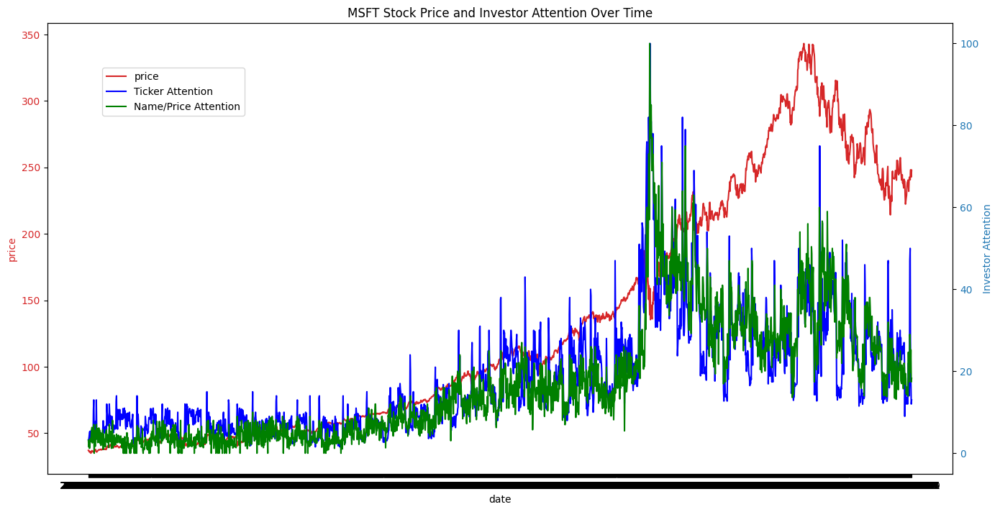

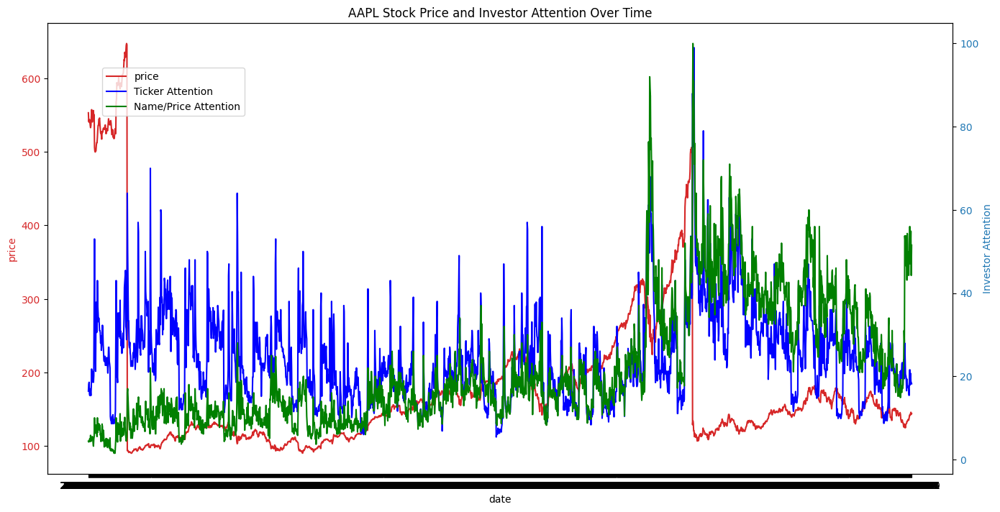

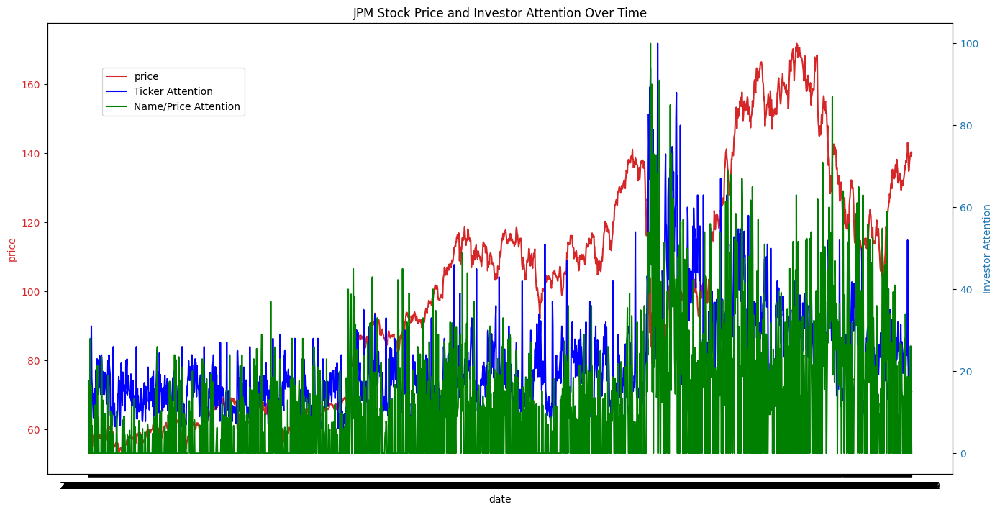

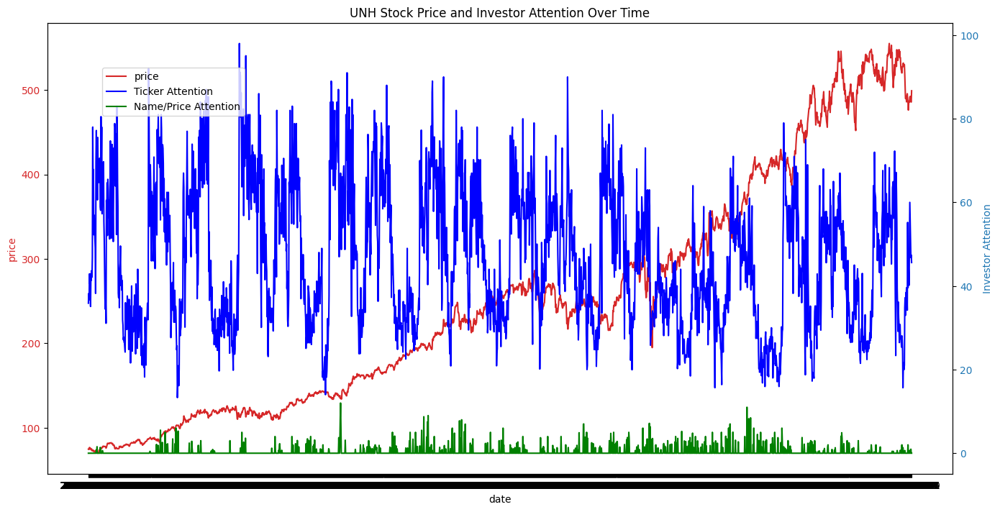

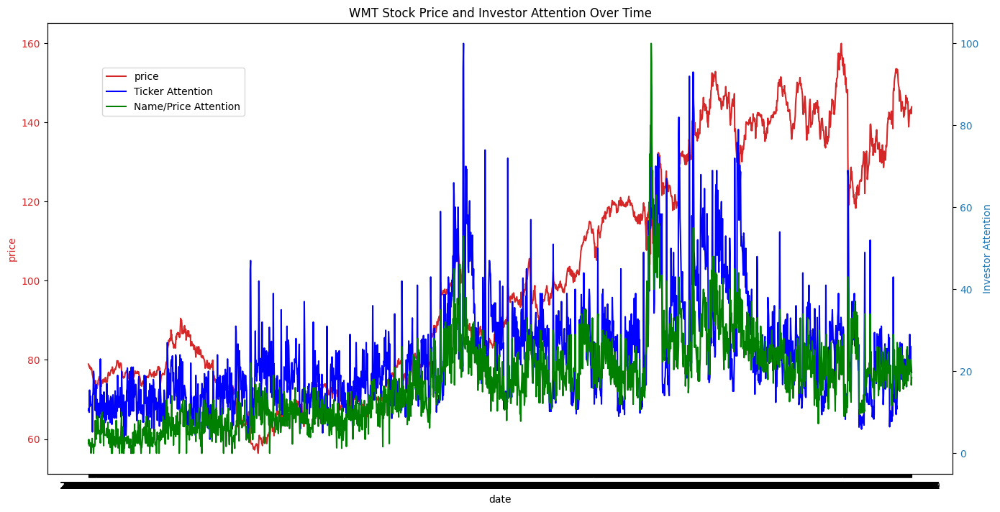

...

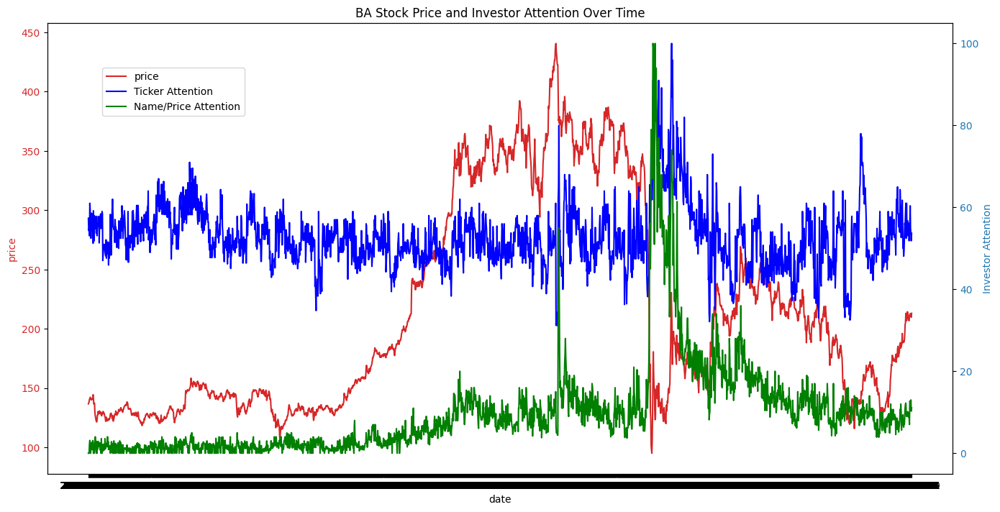

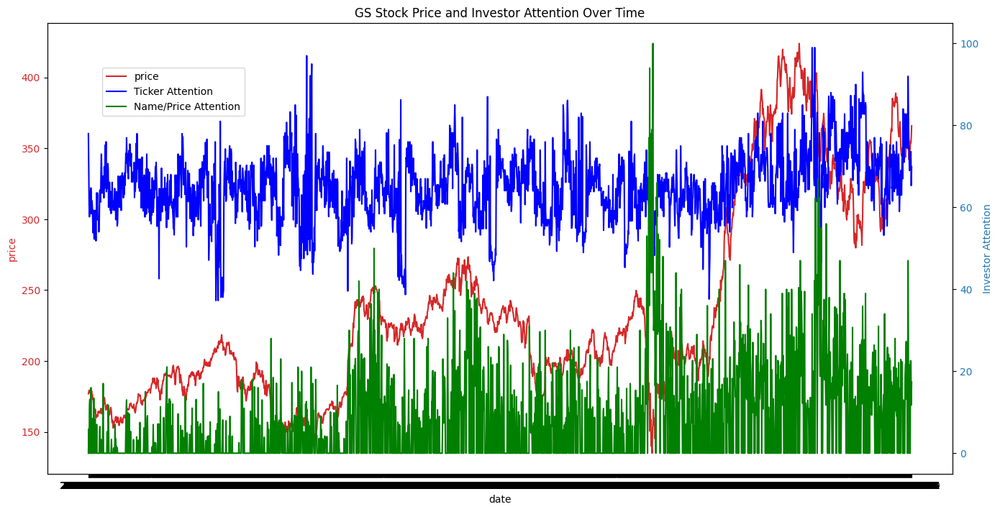

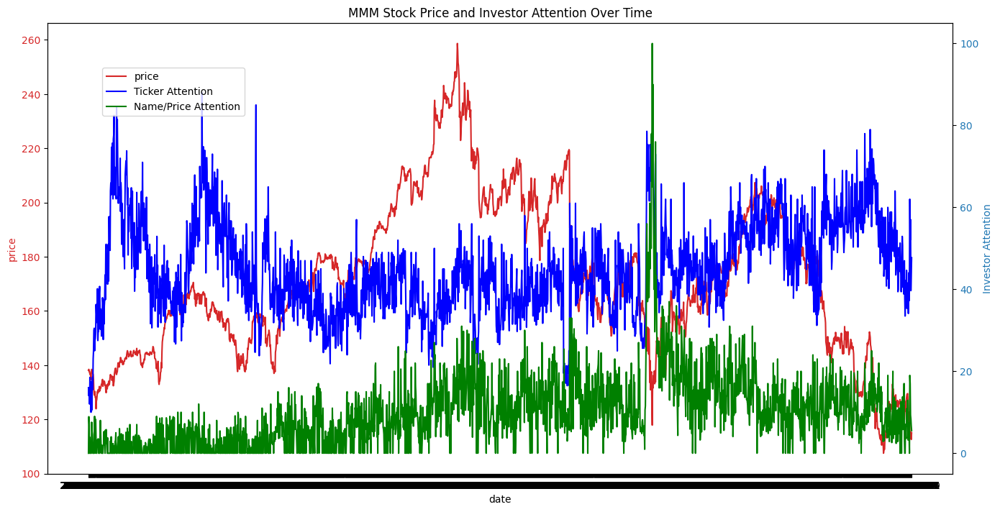

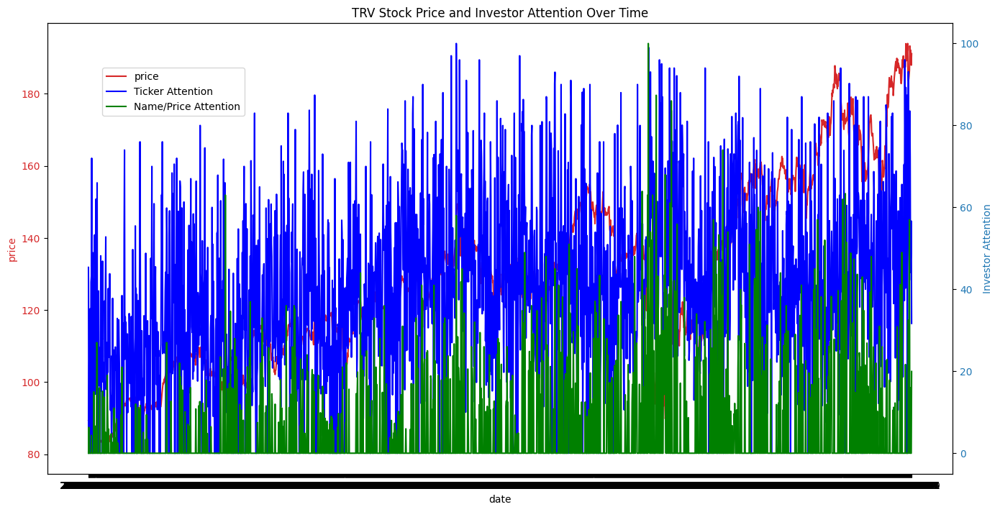

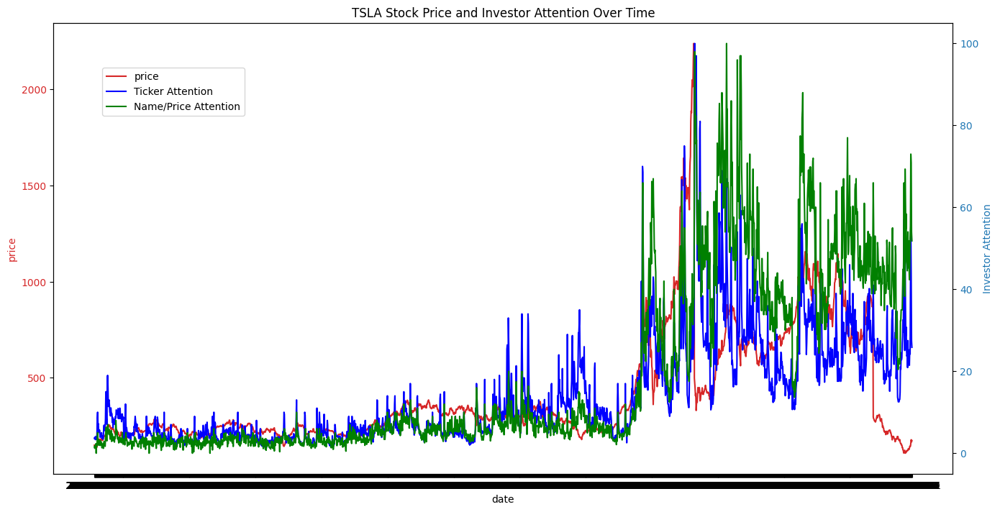

In [19]:
# loop that creates a time series plot for each stock containing price, ticker_attention, and name_price_attention

stocks = data['ticker'].unique()

for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax1 = plt.subplots(figsize=(14, 7))

    color = 'tab:red'
    ax1.set_xlabel('date')
    ax1.set_ylabel('price', color=color)
    ax1.plot(stock_data['date'], stock_data['price'], color=color, label='price')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('Investor Attention', color=color)  # we already handled the x-label with ax1
    ax2.plot(stock_data['date'], stock_data['ticker_attention'], color='blue', label='Ticker Attention')
    ax2.plot(stock_data['date'], stock_data['name_price_attention'], color='green', label='Name/Price Attention')
    ax2.tick_params(axis='y', labelcolor=color)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title(f'{stock} Stock Price and Investor Attention Over Time')
    fig.legend(loc="upper left", bbox_to_anchor=(0.1,0.9))
    plt.show()

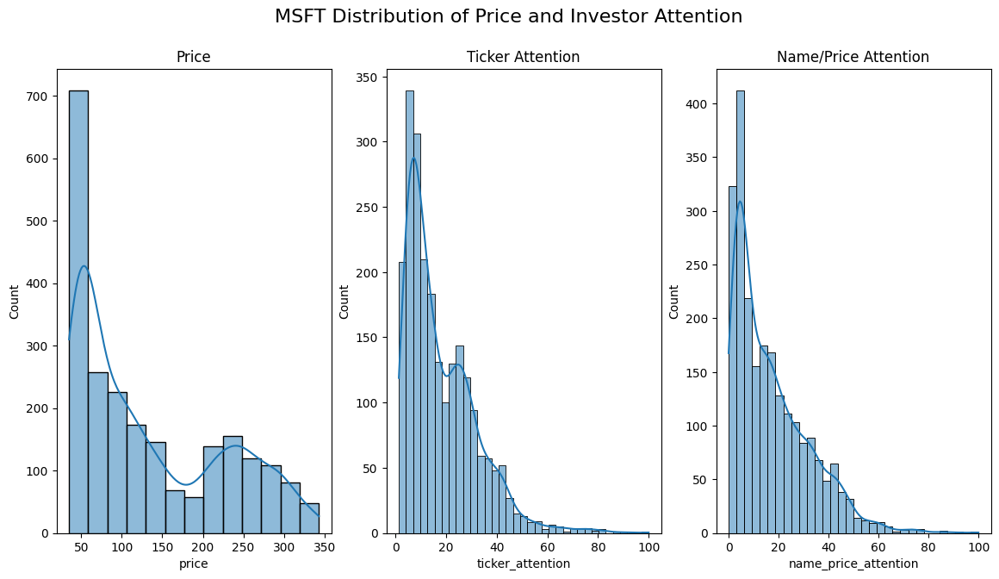

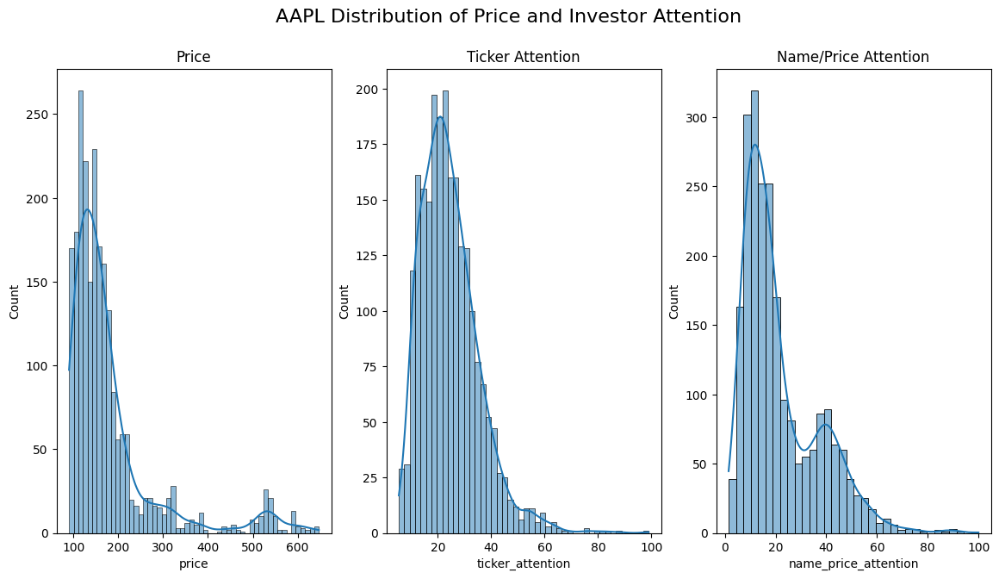

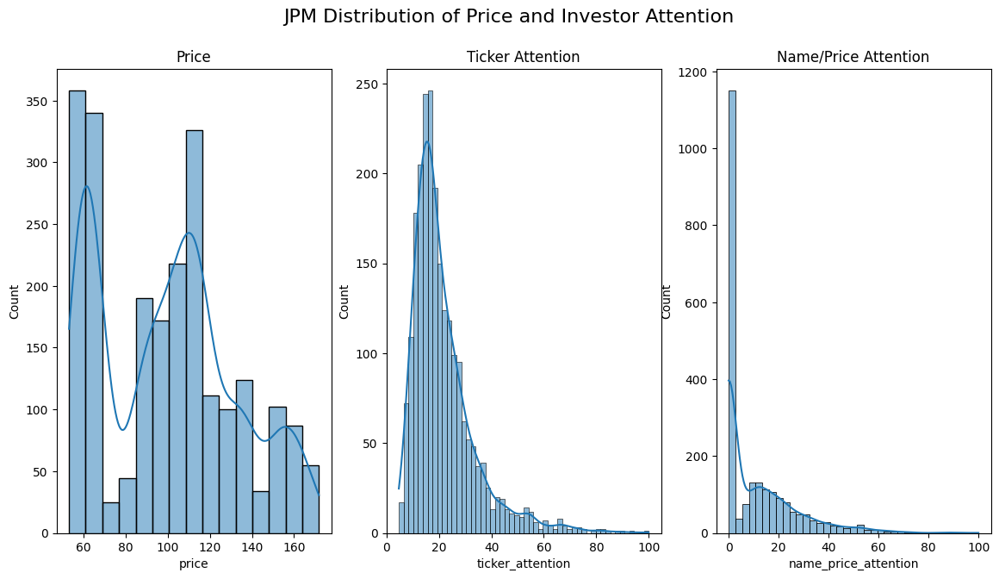

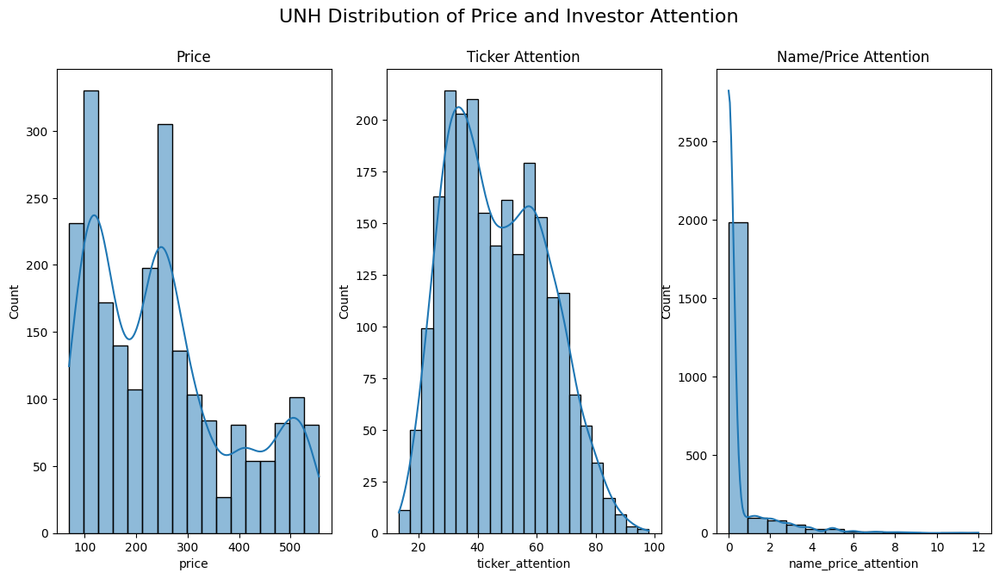

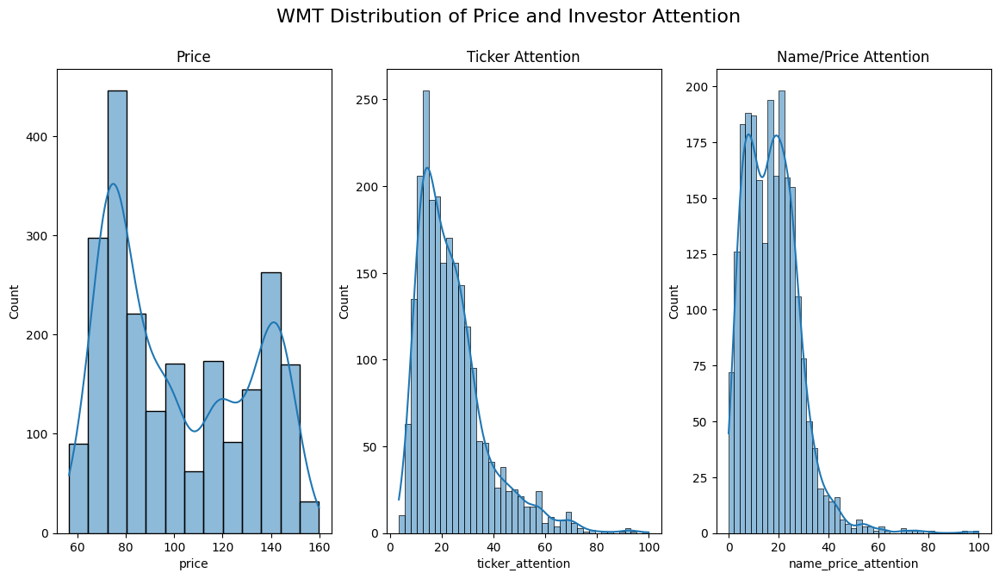

...

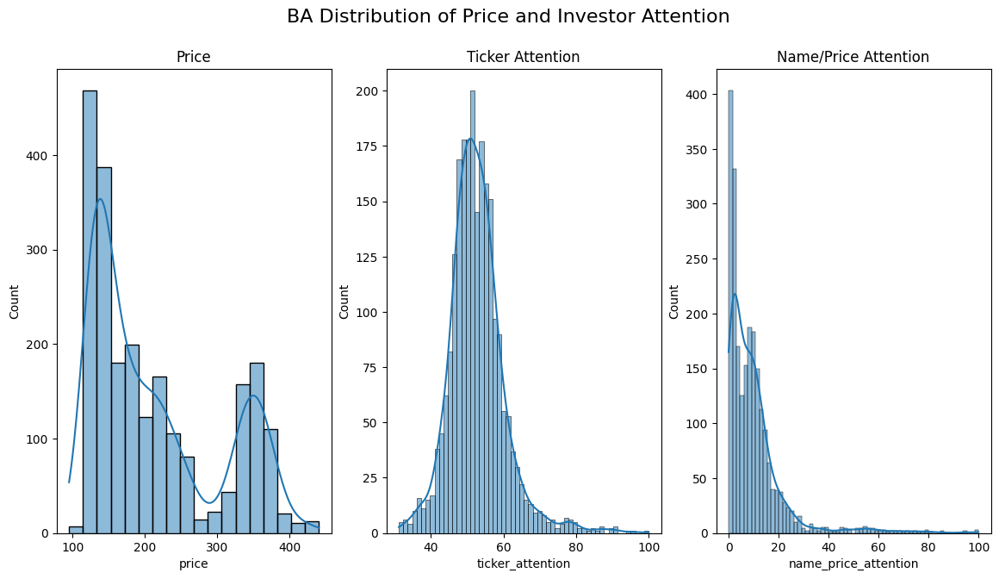

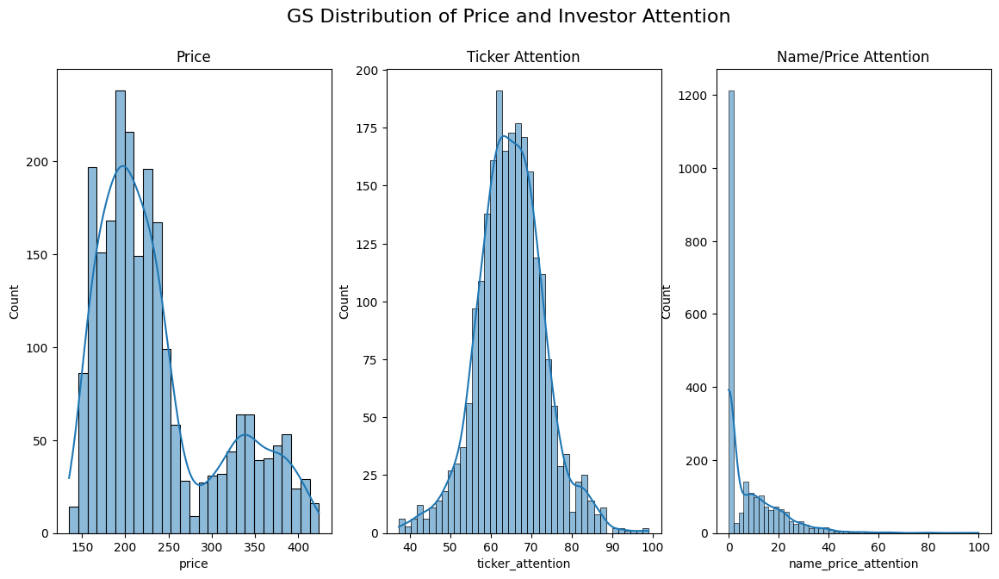

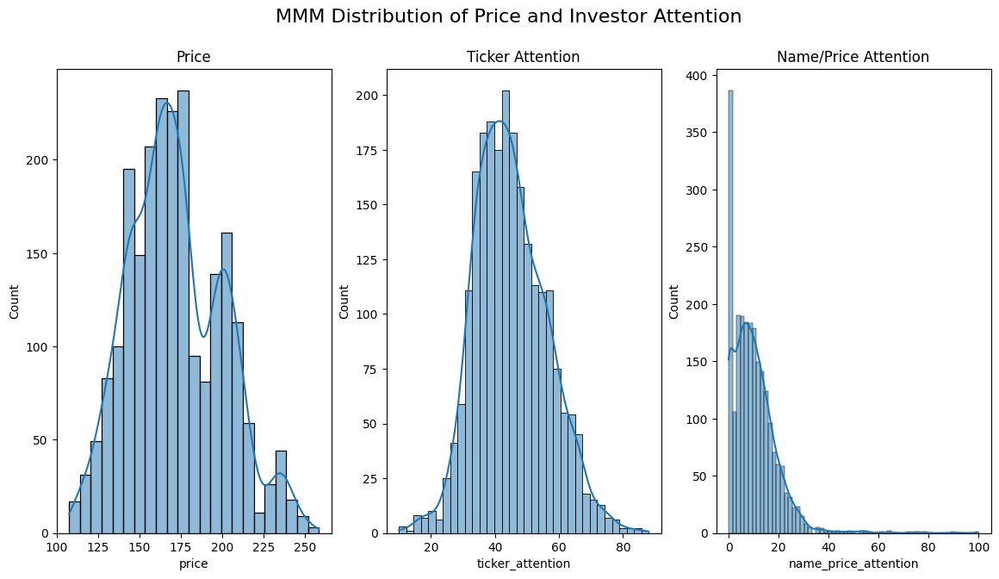

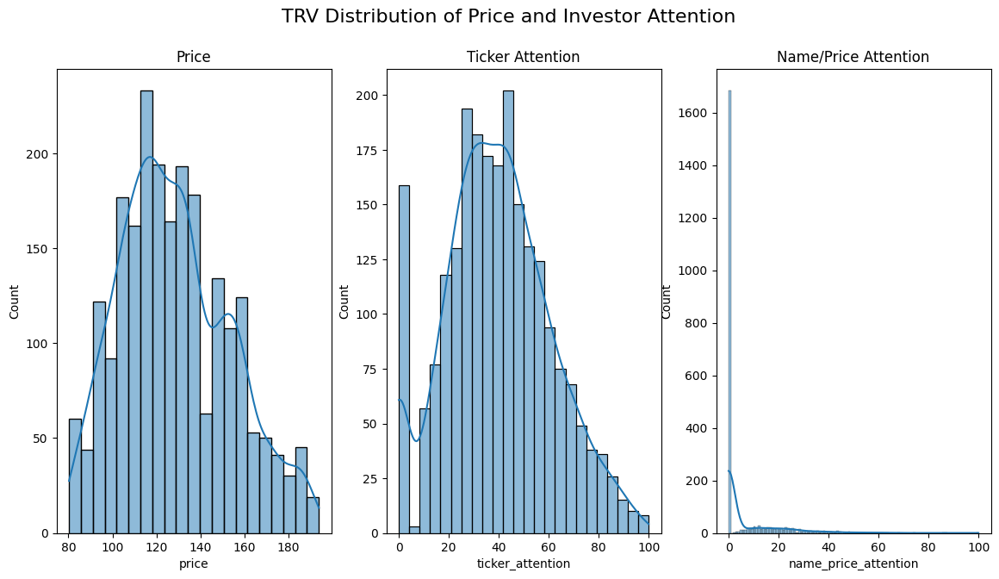

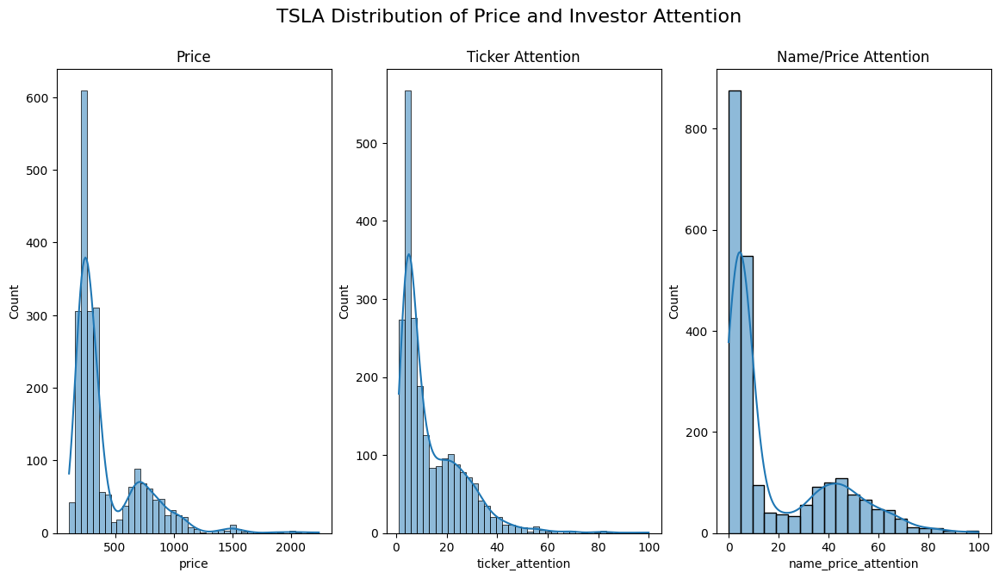

In [20]:
# loop that creates a histogram to show the distribution of data['price'],data['ticker_attention'], and data['name_price_attention']  for each stock

for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax = plt.subplots(1, 3, figsize=(14, 7))
    fig.suptitle(f'{stock} Distribution of Price and Investor Attention', fontsize=16)
    sns.histplot(stock_data['price'], kde=True, ax=ax[0])
    ax[0].set_title('Price')
    sns.histplot(stock_data['ticker_attention'], kde=True, ax=ax[1])
    ax[1].set_title('Ticker Attention')
    sns.histplot(stock_data['name_price_attention'], kde=True, ax=ax[2])
    ax[2].set_title('Name/Price Attention')
    plt.show()


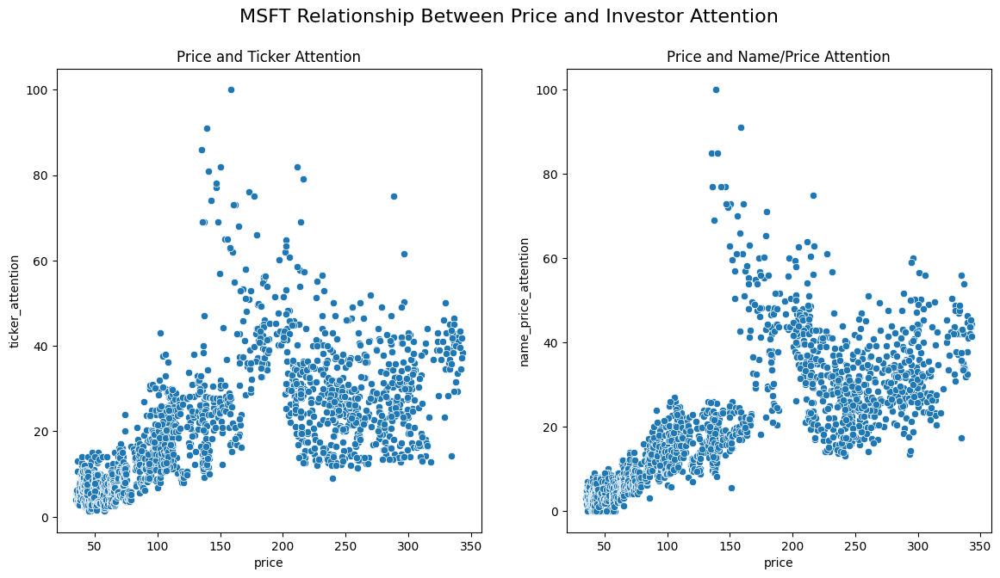

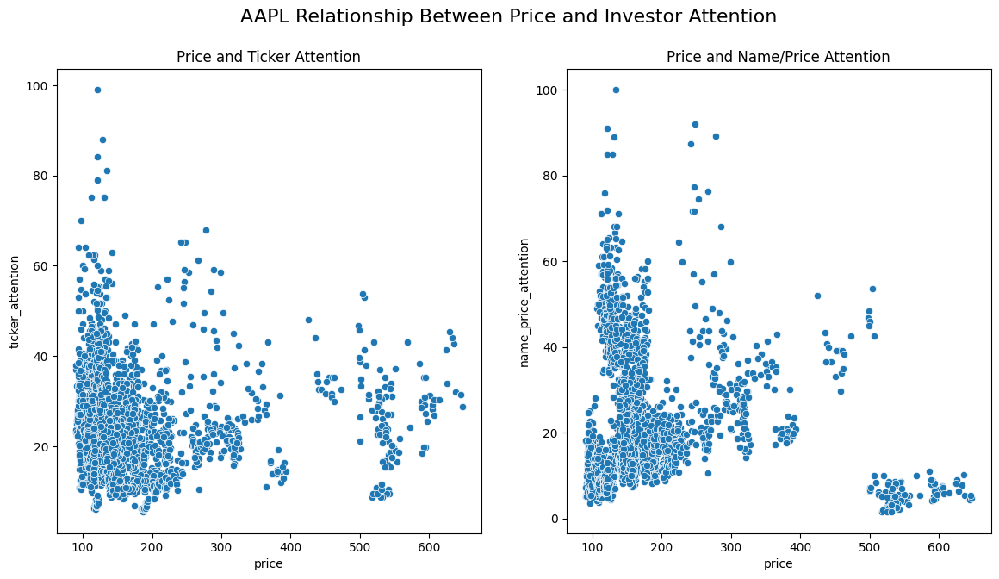

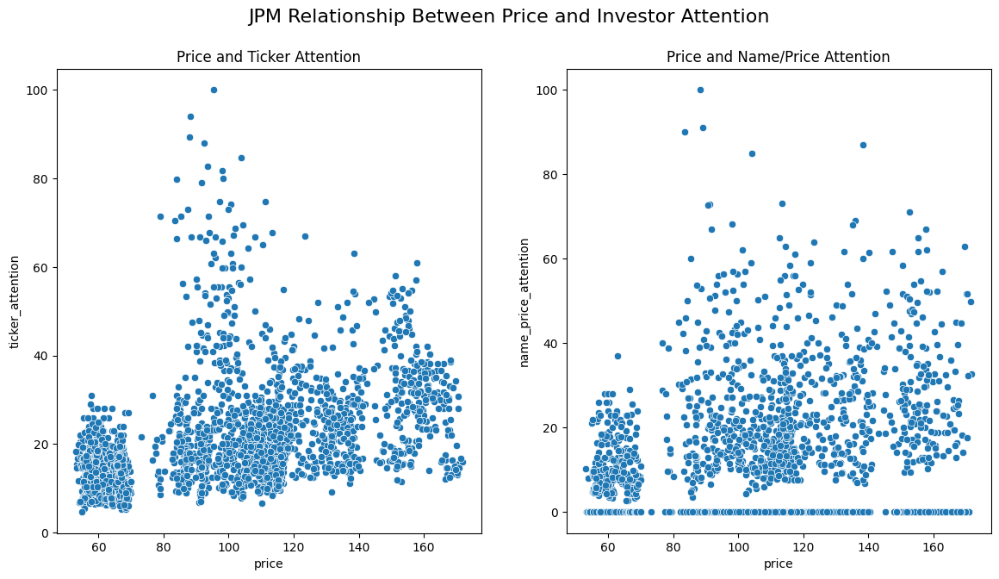

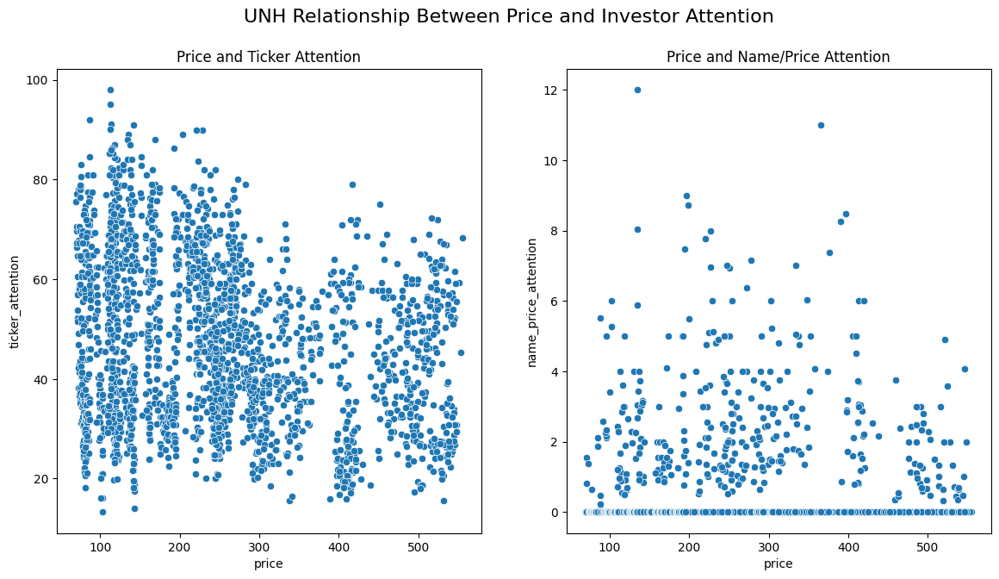

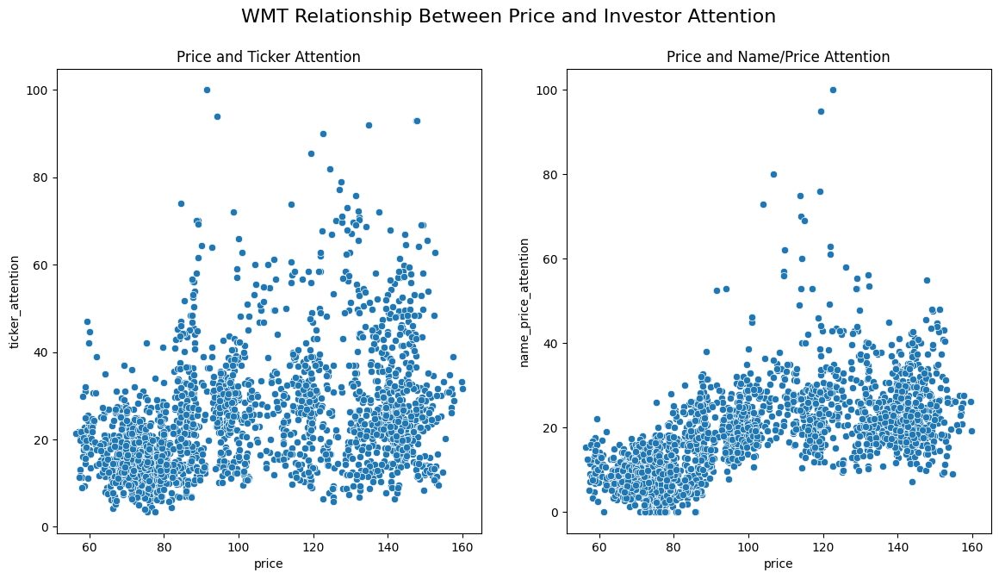

...

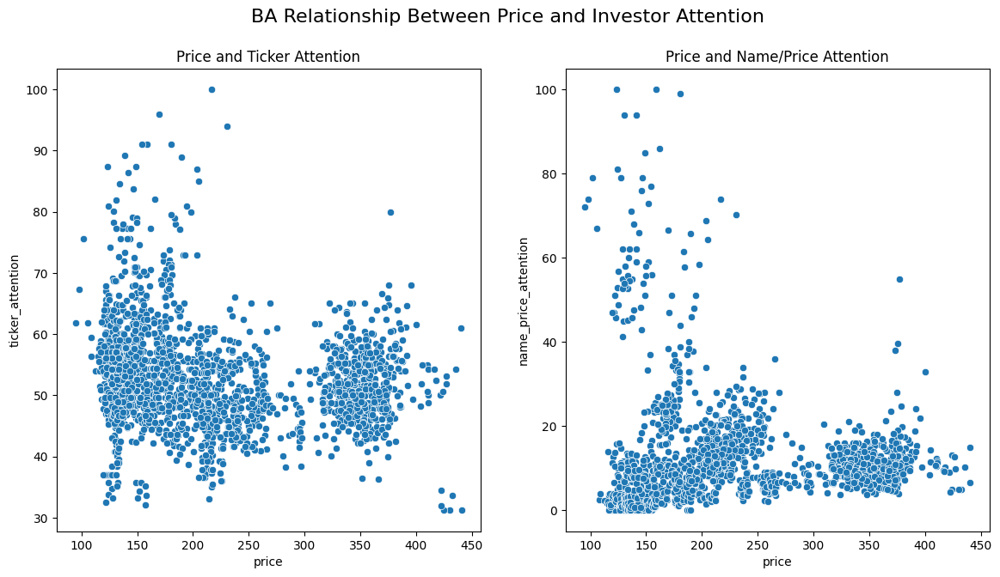

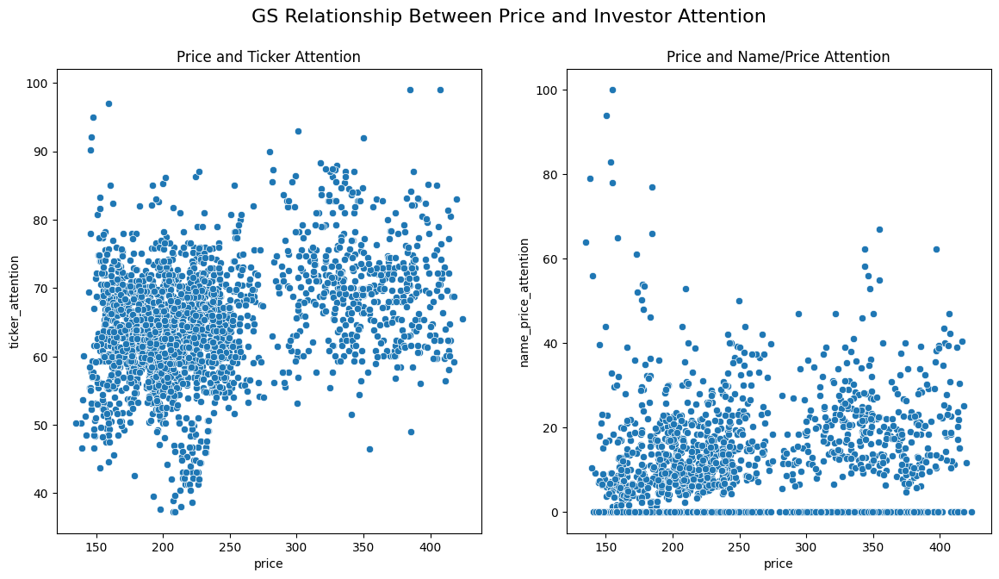

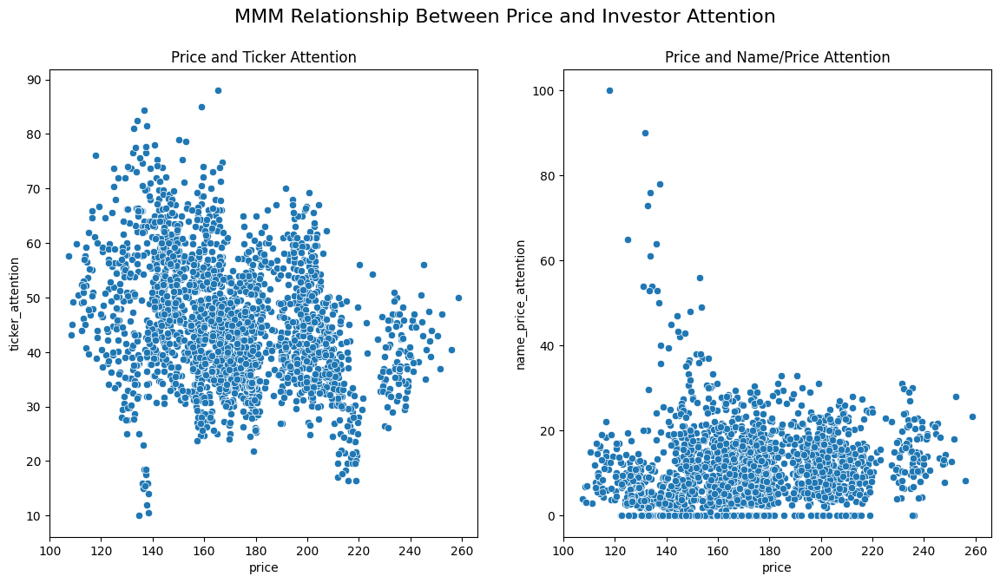

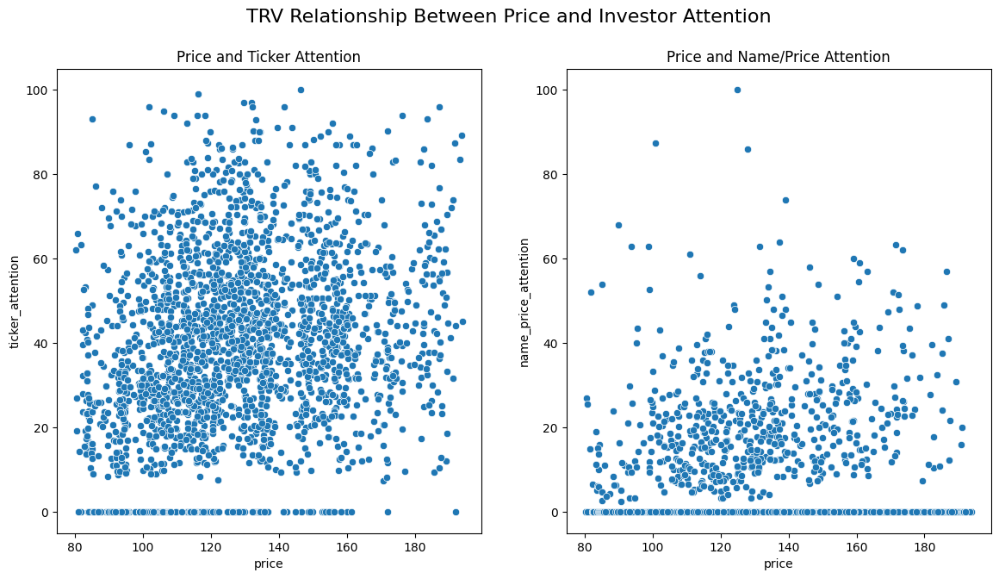

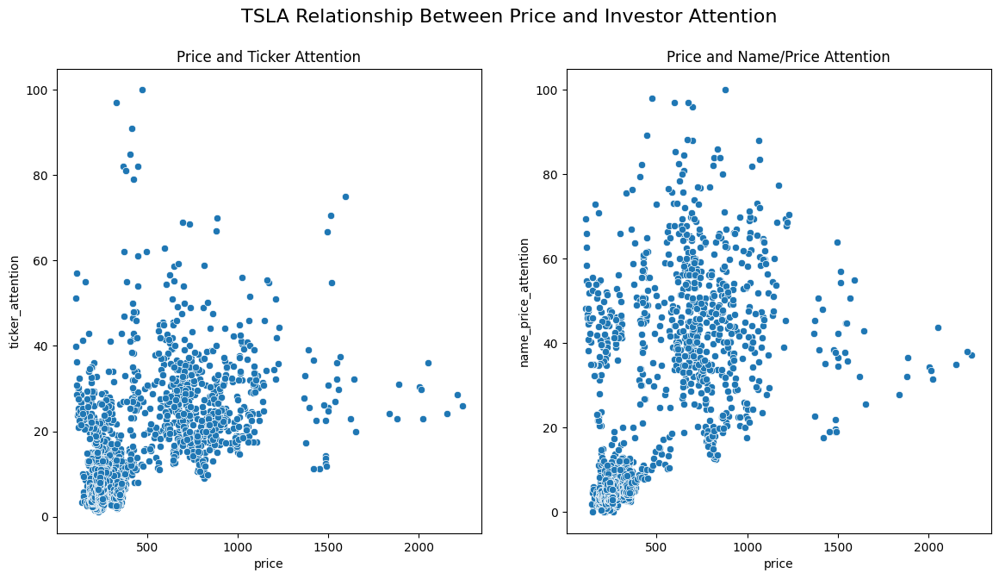

In [21]:
# loop that creates a scatter plots to show the relationship between price and ticker_attention and price and name_price_attention for each stock

for stock in stocks:
    stock_data = data[data['ticker'] == stock]
    fig, ax = plt.subplots(1, 2, figsize=(14, 7))
    fig.suptitle(f'{stock} Relationship Between Price and Investor Attention', fontsize=16)
    sns.scatterplot(x=stock_data['price'], y=stock_data['ticker_attention'], ax=ax[0])
    ax[0].set_title('Price and Ticker Attention')
    sns.scatterplot(x=stock_data['price'], y=stock_data['name_price_attention'], ax=ax[1])
    ax[1].set_title('Price and Name/Price Attention')
    plt.show()

# Industry related visulizations

1. Time series of returns for all industries
2. Time series of returns for each industry

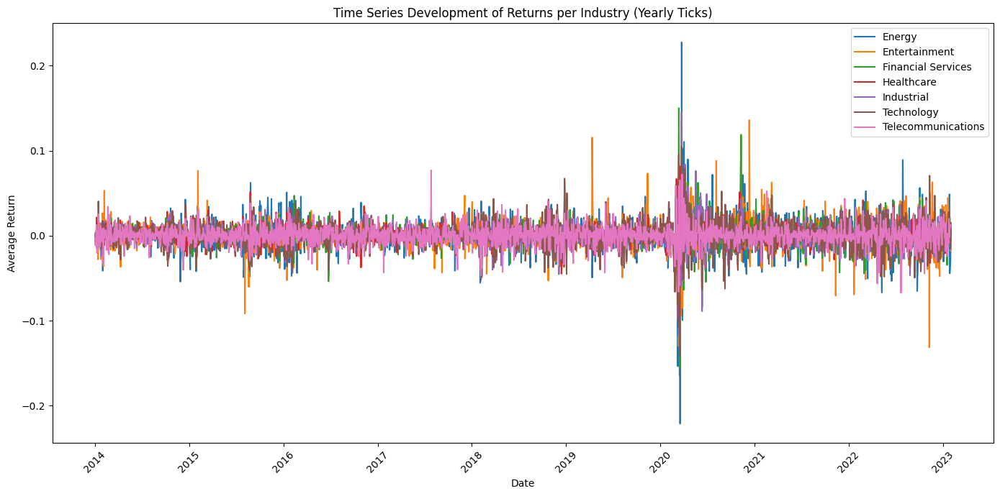

In [29]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Converting 'date' column to datetime format for easier handling
industry_returns_pivot.index = pd.to_datetime(industry_returns_pivot.index)

# Plotting with adjusted date ticks
plt.figure(figsize=(14, 7))
for industry in industry_returns_pivot.columns:
    plt.plot(industry_returns_pivot.index, industry_returns_pivot[industry], label=industry)

plt.title('Time Series Development of Returns per Industry (Yearly Ticks)')
plt.xlabel('Date')
plt.ylabel('Average Return')
plt.legend()

# Setting x-axis to only show the first occurrence of each year
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



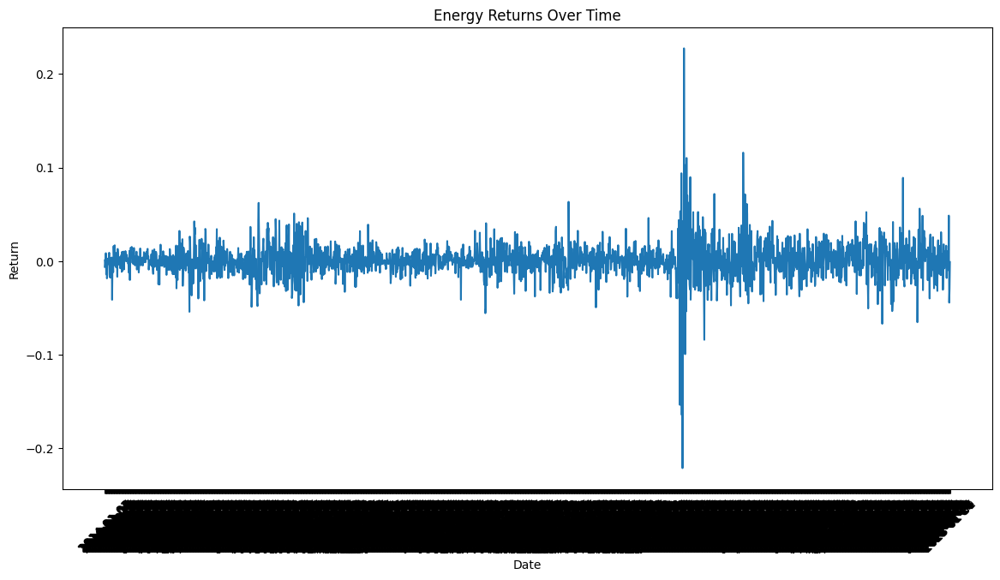

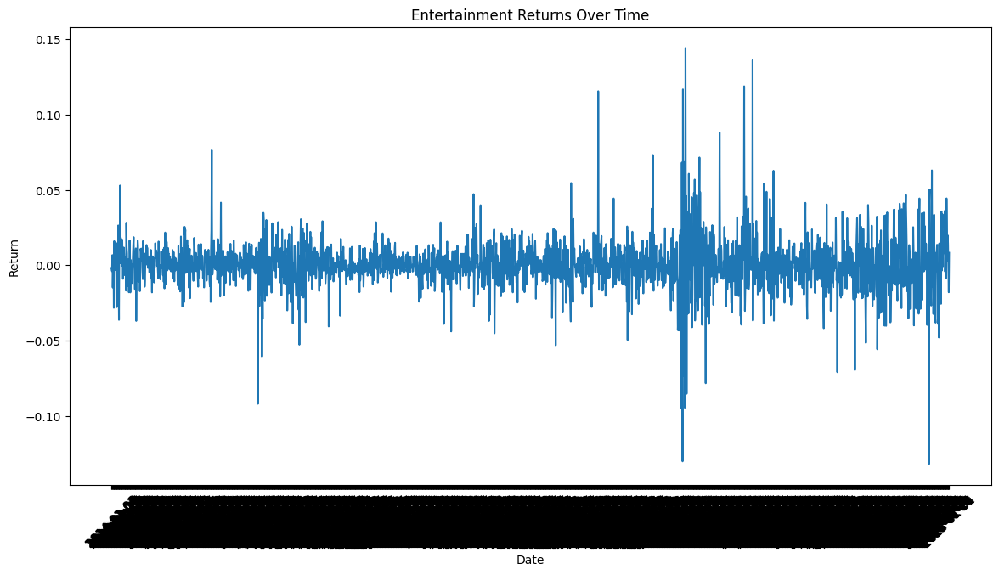

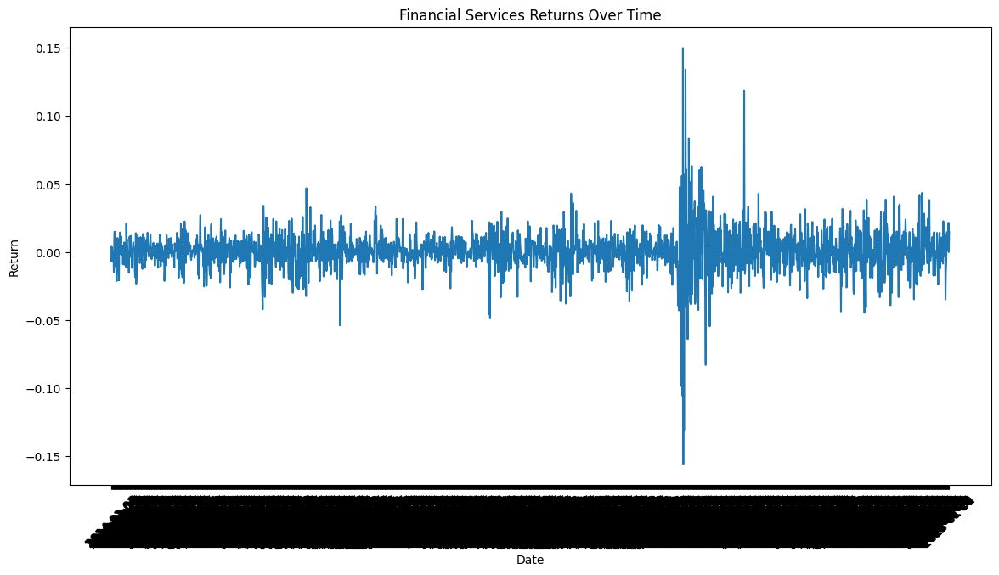

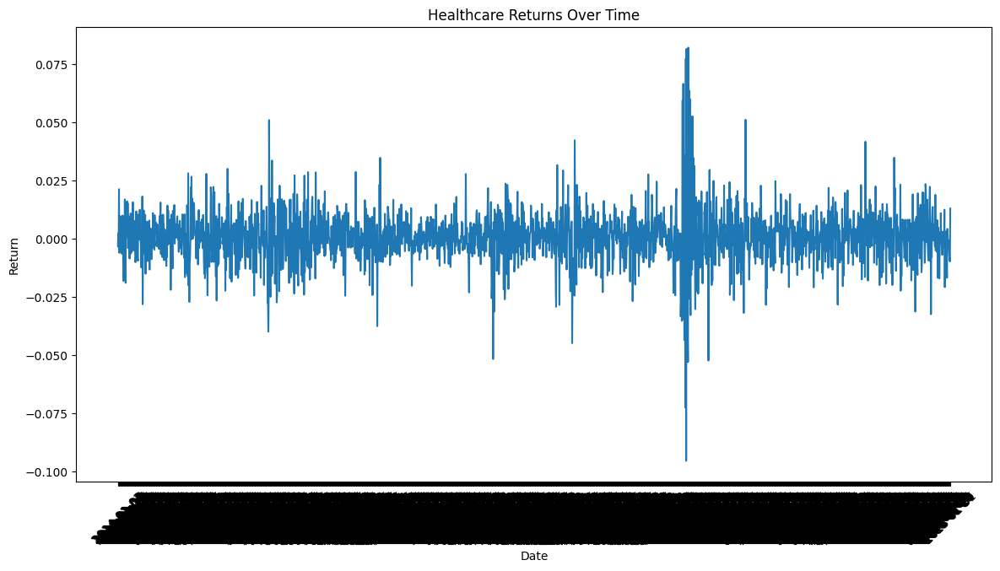

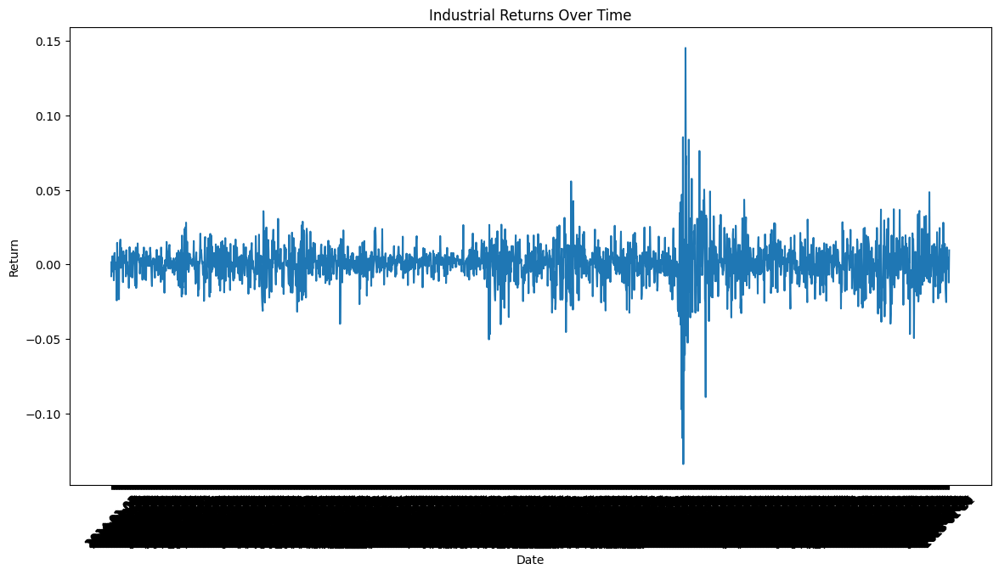

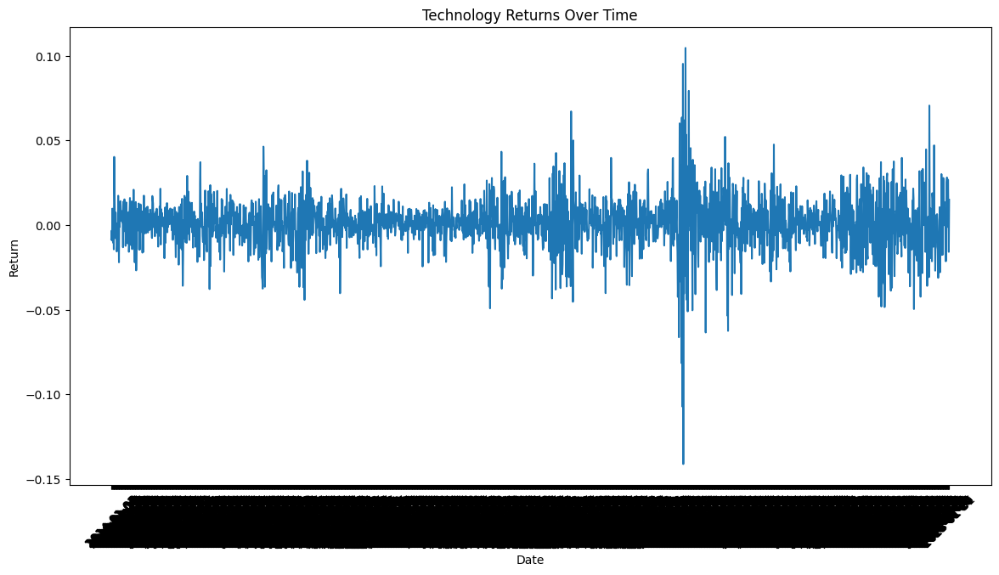

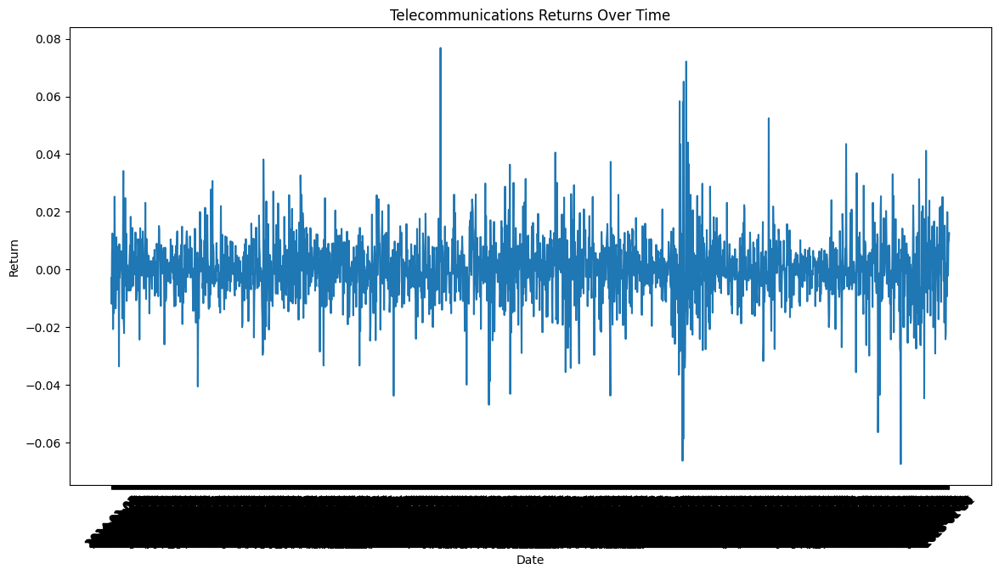

In [28]:
# write a loop to create a time series plot of returns for each industry 

for industry in industry_returns['Industry'].unique():
    industry_data = industry_returns[industry_returns['Industry'] == industry]
    plt.figure(figsize=(14, 7))
    plt.plot(industry_data['date'], industry_data['return'])
    plt.title(f'{industry} Returns Over Time')
    plt.xlabel('Date')
    plt.ylabel('Return')
    plt.xticks(rotation=45)
    plt.show()